# Working with Video Data in Python

This notebook was created for the [YouTube tutorial that you can find here](https://youtu.be/AxIc-vGaHQ0)!!


- What you will learn:
    - What is video data?
    - Converting between video formats
    - Pulling metadata from video file.
    - How to open a video file and extract images using cv2 (openCV).
    - Adding annotations to video frames.
    - Saving edited video.

# What is video data?
Simply put, video data is a series of images that when shown in sucession give the illusion of motion. Like a flipbook!

<img src="https://i.imgur.com/Rx9R3Hf.jpg" width="500" height="500" />




## Video resolution
Video resolution is the size of each image in the video. It doesn't need to be a standard size, but there are common sizes for video.

<img src="https://i.imgur.com/CUo7rGb.png" width="500" height="500" />

## What is frame rate?

Frame rate determines the number of "images" seen per second. Can be described as fps (frames per second) or Hz (general unit for frequency)

<img src="https://i.imgur.com/uSOX932.jpg" width="500" height="500" />

#
- opencv / cv2 : `pip install opencv-python`
- matplotlib : `pip install matplotlib`
- ffmpeg (for converting videos)

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm import tqdm

import subprocess

plt.style.use('ggplot')

# Converting video types
Use ffmpeg to convert mov to mp4. Read more in the documentation here: https://ffmpeg.org/ffmpeg.html

In [7]:
input_file = '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '026c7465-309f6d33.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['ffmpeg', '-i', '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=4294967294)

In [9]:
# !ls -GFlash --color
dir

<function dir>

# Display Video in Notebook

In [10]:
ipd.Video('026c7465-309f6d33.mp4', width=700)

# Open the Video and Read Metadata

In [11]:
# Load in video capture
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [15]:
# Total number of frames in video
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [17]:
# Video height and width
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 720.0, Width 1280.0


In [19]:
# Get frames per second
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 59.94


In [20]:
cap.release()

# Pulling in Images from Video

Returned True and img of shape (720, 1280, 3)


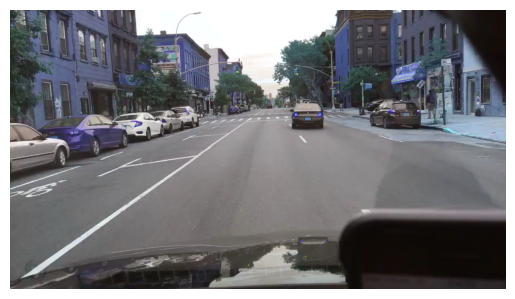

In [25]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')
plt.imshow(img)
plt.axis('off')
plt.show()

In [28]:
## Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

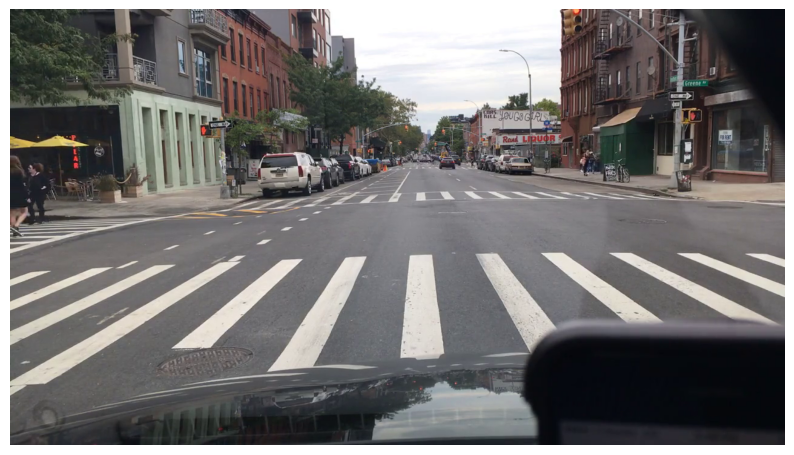

In [29]:
display_cv2_img(img)

In [30]:
cap.release()

# Display multiple frames from the video

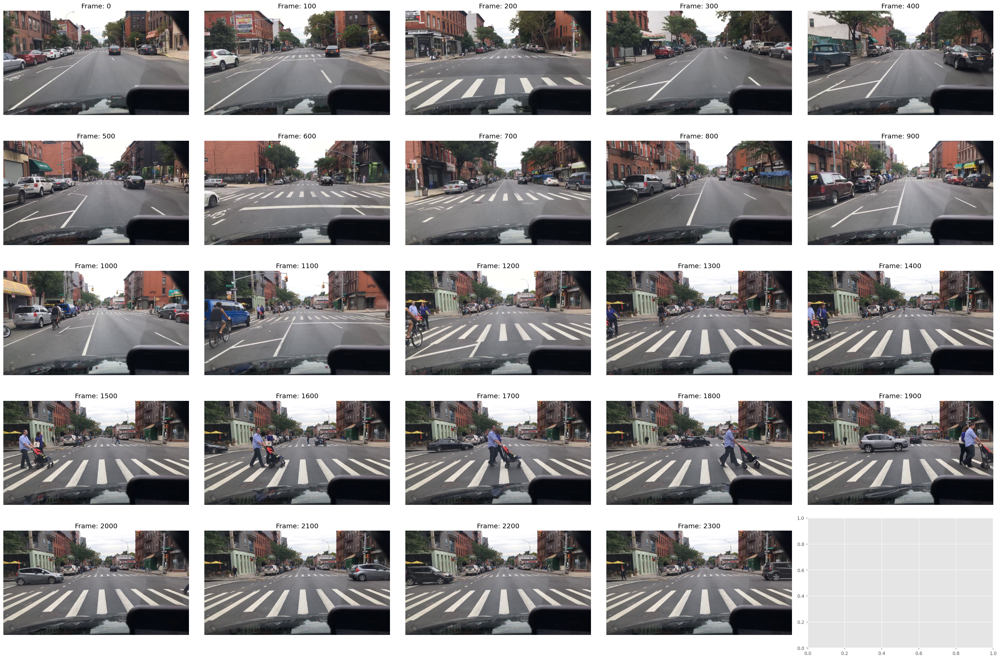

In [31]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# Add Annotations to Video Images

In [34]:
labels = pd.read_csv('mot_labels.csv',
                     low_memory=False)
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [35]:
video_labels["category"].value_counts()

category
car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: count, dtype: int64

In [37]:
# Pull frame 1035

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

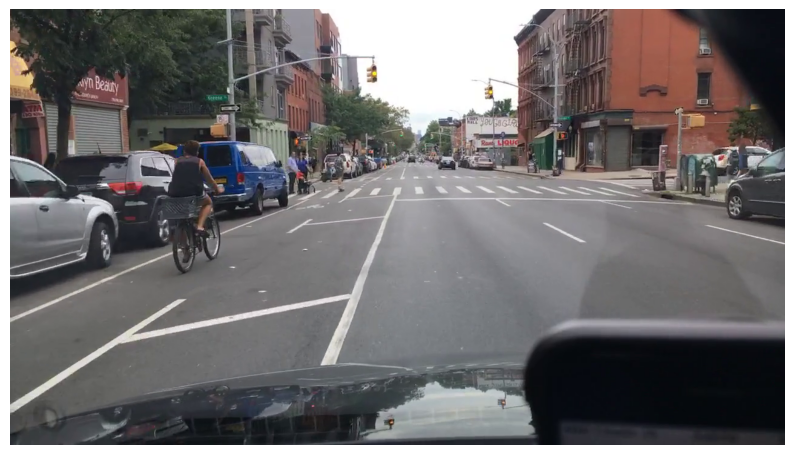

In [38]:
display_cv2_img(img)

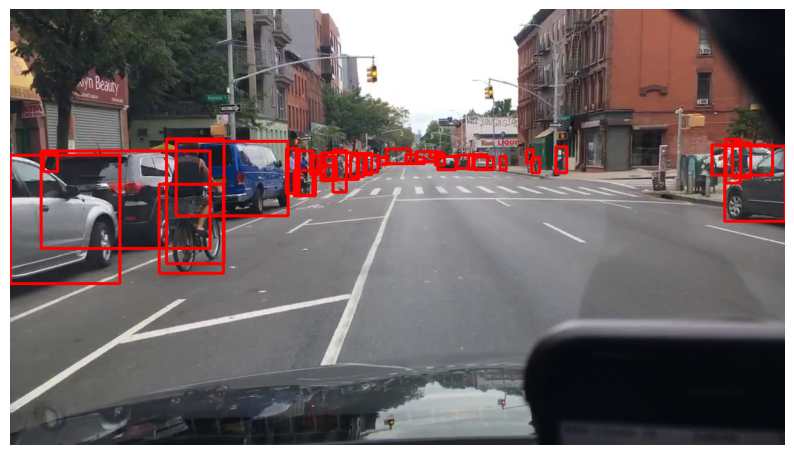

In [39]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)

display_cv2_img(img_example)

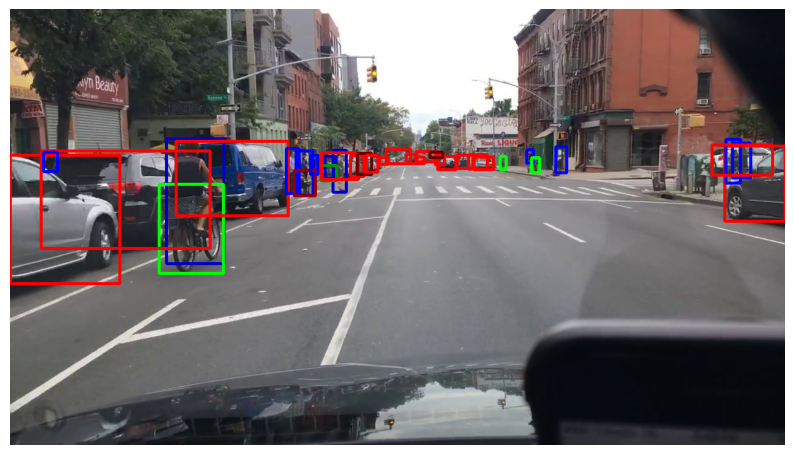

In [40]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

## Adding Text

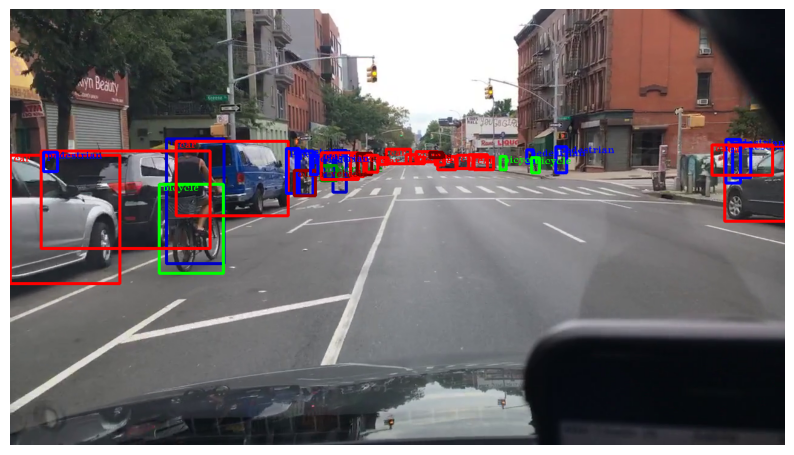

In [41]:
frame_labels = video_labels.query("video_frame == @frame")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
display_cv2_img(img_example)
cap.release()

# Label and output Annotated Video

In [42]:
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

In [43]:
!rm -r out_test.mp4

'rm' is not recognized as an internal or external command,
operable program or batch file.


In [44]:
VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width, height))

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

100%|██████████| 2398/2398 [00:47<00:00, 50.56it/s]


In [25]:
!ls -GFlash -color

total 91M
 72M -rw-r--r-- 1 root  72M Jun 13 01:53 out_test.mp4
6.1M ---------- 1 root 6.1M Jun 13 01:53 __notebook__.ipynb
 14M -rw-r--r-- 1 root  14M Jun 13 01:52 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 6 root 4.0K Jun 13 01:51 ../
4.0K drwxr-xr-x 2 root 4.0K Jun 13 01:52 ./


# Convert labeled output to mp4 and view

In [45]:
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [27]:
!ls -GFlash --color

total 120M
4.0K drwxr-xr-x 2 root 4.0K Jun 13 01:53 ./
4.0K drwxr-xr-x 6 root 4.0K Jun 13 01:51 ../
 14M -rw-r--r-- 1 root  14M Jun 13 01:52 026c7465-309f6d33.mp4
6.1M ---------- 1 root 6.1M Jun 13 01:53 __notebook__.ipynb
 72M -rw-r--r-- 1 root  72M Jun 13 01:53 out_test.mp4
 29M -rw-r--r-- 1 root  29M Jun 13 01:53 out_test_compressed.mp4


In [46]:
ipd.Video('out_test_compressed.mp4', width=600)